In [35]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style="whitegrid")

In [36]:
# Load data
df = pd.read_csv('../data/cleaned_recipes_v2.csv',index_col=0)
df.head()

,title,steps,rating,cuisine,continent,sub_region,Calories,Fat,Carbs,Protein,prep_time,cook_time,additional_time,total_time,servings,ingredients
0,Homemade Lasagna,['Gather all ingredients.Dotdash Meredith Food...,4.6,Italy,Europe,Southern Europe,638.0,27.0,54.0,46.0,85,75,10,170,8.0,"['ground pork', 'lean ground beef', 'onion', '..."
1,Chicken Parmesan,['Gather the ingredients. Preheat an oven to 4...,4.8,Italy,Europe,Southern Europe,471.0,25.0,25.0,42.0,15,20,10,45,4.0,"['breast halves', 'salt', 'eggs', 'bread crumb..."
2,Chicken Marsala,['Gather all ingredients.Dotdash Meredith Food...,4.6,Italy,Europe,Southern Europe,448.0,27.0,13.0,29.0,10,20,0,30,4.0,"['purpose flour', 'salt', 'black pepper', 'but..."
3,Spaghetti Aglio e Olio,['Gather all ingredients.Dotdash Meredith Food...,4.7,Italy,Europe,Southern Europe,755.0,35.0,87.0,23.0,10,15,0,25,4.0,"['uncooked spaghetti', 'olive oil', 'pepper fl..."
4,Shrimp Scampi with Pasta,"['Gather ingredients.', 'Bring a large pot of ...",4.6,Italy,Europe,Southern Europe,511.0,19.0,58.0,22.0,20,20,0,40,6.0,"['linguine pasta', 'butter', 'shallots', 'shri..."


In [37]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3843 entries, 0 to 3842
Data columns (total 16 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   title            3843 non-null   object 
 1   steps            3843 non-null   object 
 2   rating           3744 non-null   float64
 3   cuisine          3843 non-null   object 
 4   continent        3843 non-null   object 
 5   sub_region       3843 non-null   object 
 6   Calories         3811 non-null   float64
 7   Fat              3843 non-null   float64
 8   Carbs            3843 non-null   float64
 9   Protein          3843 non-null   float64
 10  prep_time        3843 non-null   int64  
 11  cook_time        3843 non-null   int64  
 12  additional_time  3843 non-null   int64  
 13  total_time       3843 non-null   int64  
 14  servings         3843 non-null   float64
 15  ingredients      3843 non-null   object 
dtypes: float64(6), int64(4), object(6)
memory usage: 510.4+ KB


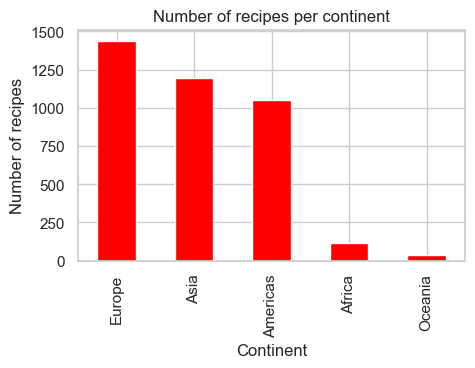

In [38]:
plt.figure(figsize=(5,3))
df["continent"].value_counts().plot(kind='bar',color='red',orientation='vertical')
plt.title('Number of recipes per continent')
plt.ylabel('Number of recipes')
plt.xlabel('Continent')
plt.savefig("../assets/recipes_per_continent.png")
plt.show()

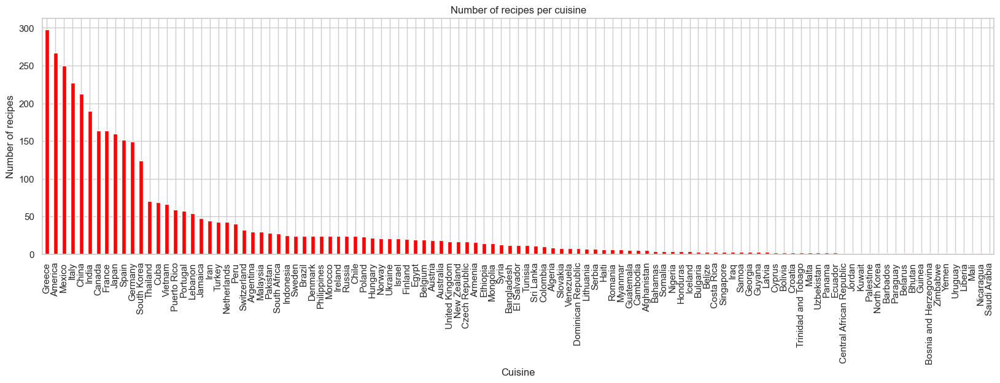

In [39]:
plt.figure(figsize=(20,5))
df["cuisine"].value_counts().plot(kind='bar',color='red',orientation='vertical')
plt.title('Number of recipes per cuisine')
plt.ylabel('Number of recipes')
plt.xlabel('Cuisine')
plt.savefig("../assets/recipes_per_cuisine.png")
plt.show()

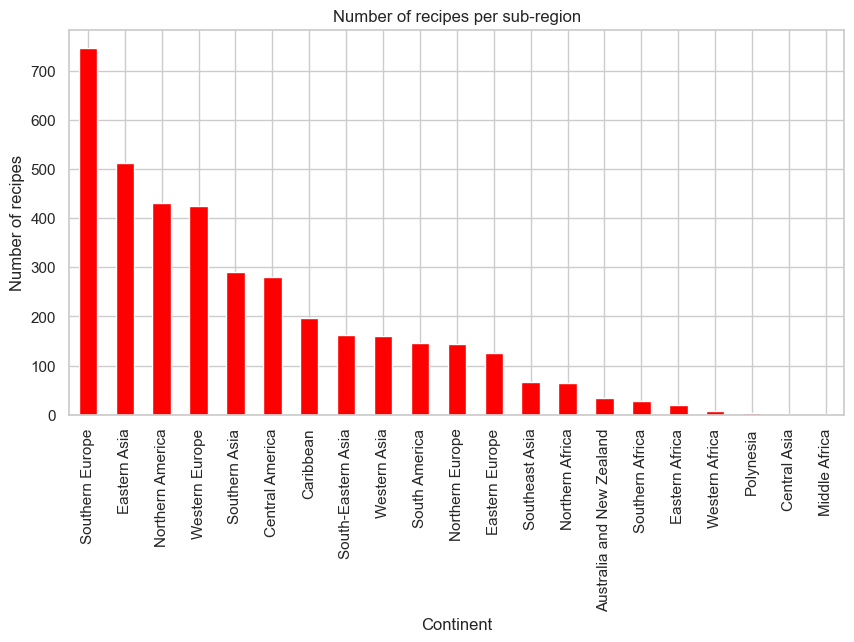

In [40]:
plt.figure(figsize=(10,5))
df["sub_region"].value_counts().plot(kind='bar',color='red',orientation='vertical')
plt.title('Number of recipes per sub-region')
plt.ylabel('Number of recipes')
plt.xlabel('Continent')
plt.savefig("../assets/recipes_per_continent.png")
plt.show()

In [41]:
for i in range(len(df)):
    df['ingredients'][i] = df['ingredients'][i].replace('[','').replace(']','').replace("'",'').replace("",'').replace('"','').split(',')

/var/folders/9t/hj30jvr52kscxxdg1z2kq1600000gn/T/ipykernel_35670/2835310393.py:2: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df['ingredients'][i] = df['ingredients'][i].replace('[','').replace(']','').replace("'",'').replace("",'').replac

In [42]:
for i in range(len(df)):
    df['ingredients'][i] = [x.strip() for x in df['ingredients'][i]]
    df['ingredients'][i] = [x.replace(' ','_') for x in df['ingredients'][i]]

/var/folders/9t/hj30jvr52kscxxdg1z2kq1600000gn/T/ipykernel_35670/2324130931.py:2: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df['ingredients'][i] = [x.strip() for x in df['ingredients'][i]]
/var/folders/9t/hj30jvr52kscxxdg1z2kq1600000gn/T

In [43]:
df['ingredients'][0]

['ground_pork',
 'lean_ground_beef',
 'onion',
 'tomato',
 'garlic',
 'basil',
 'salt',
 'white_sugar',
 'lasagna_noodles',
 'curd_cottage_cheese',
 'eggs',
 'salt',
 'black_pepper']

In [44]:
ingredients_set = set()

for i in range(len(df)):
    for ingredient in df['ingredients'][i]:
        ingredients_set.add(ingredient)

In [45]:
ingredients_set

{'hickory_wood_chunks',
 'red_new_potatoes',
 'linguiça_sausage',
 'beef_top_sirloin',
 'cooking_grits',
 'blueberries',
 'free_plain_style_yogurt',
 'backfat',
 'Corona_beans',
 'chicken',
 'japones',
 'pitted_dates',
 'cilantro_sprigs',
 'tortilla',
 'sliced_lengthwise',
 'sliced_bamboo_shoots',
 'mashed_potatoes',
 'vegan_tortillas',
 'russet_potato',
 'beets',
 'curry_leaves',
 'grenadine_syrup',
 'sharp_Cheddar_cheese',
 'mustard_powder',
 'crust_pie_pastry',
 'raw_pistachios',
 'furikake_seasoning',
 'ginger_root',
 'egg_whites',
 'adobo_sazon_criollo',
 'beef_soup_bones',
 'chop_slices',
 'paprika',
 'choy_stalks',
 'processed_cheese_food',
 'palm_sugar',
 'bell_pepper',
 'ground_almond_meal',
 'parsnips',
 'black_cumin_seeds',
 'top',
 'sliced_jalapeno_pepper',
 'jaggery',
 'seashell_pasta',
 'matzo',
 'black_sesame_paste',
 'pita_chips',
 'veal_breast',
 'blood_oranges',
 'pitted_olives',
 'almond_slivers',
 'grain_white_rice',
 'seafood_mix',
 'oxtail',
 'aluminum_foil',
 'ba

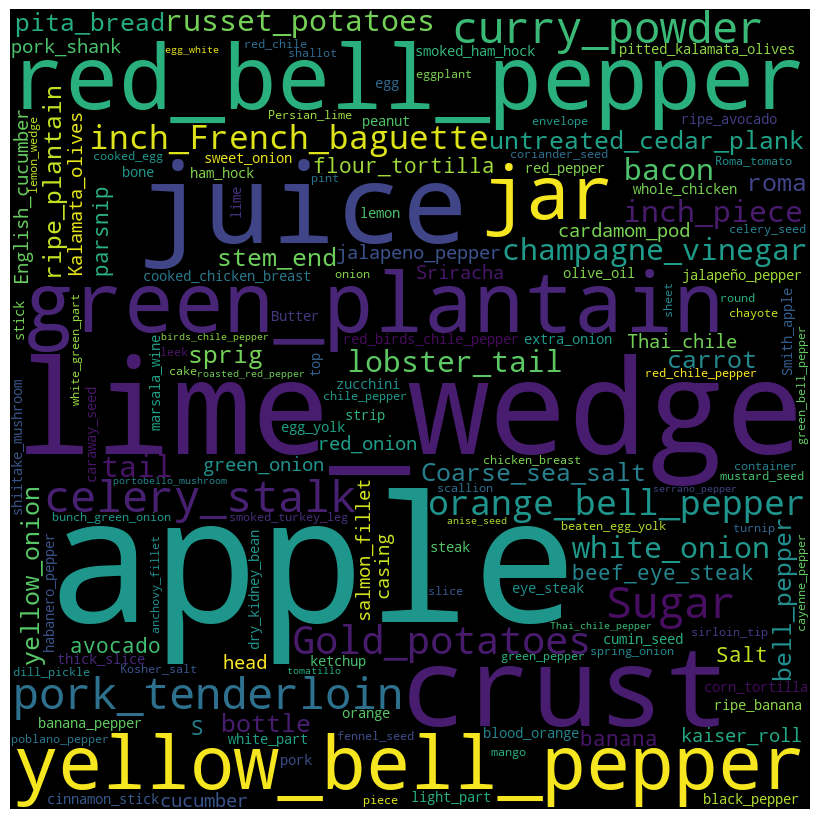

In [81]:
# word cloud
from wordcloud import WordCloud
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='black', 
                stopwords = None, 
                min_font_size = 10).generate(' '.join(ingredients_set))

plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
plt.savefig("../assets/wordcloud.png")

In [47]:
import os 
import json  

output_dir = 'json_data'
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

countries = np.unique(df['sub_region'])

c_dict = dict()
for i in countries:
    c_dict[i] = dict()
    for j in ingredients_set:
        c_dict[i][j] = 0

for i in range(len(df['sub_region'])):
    ing = df['ingredients'][i]
    print(df['sub_region'][i])
    for j in ingredients_set:
        if j in ing:
            # print(j)
            c_dict[df['sub_region'][i]][j] += 1
        
    # break

json.dump(c_dict, open('json_data/country_ingredients.json', 'w'))    

Southern Europe
Southern Europe
Southern Europe
Southern Europe
Southern Europe
Southern Europe
Southern Europe
Southern Europe
Southern Europe
Southern Europe
Southern Europe
Southern Europe
Southern Europe
Southern Europe
Southern Europe
Southern Europe
Southern Europe
Southern Europe
Southern Europe
Southern Europe
Southern Europe
Southern Europe
Southern Europe
Southern Europe
Southern Europe
Southern Europe
Southern Europe
Southern Europe
Southern Europe
Southern Europe
Southern Europe
Southern Europe
Southern Europe
Southern Europe
Southern Europe
Southern Europe
Southern Europe
Southern Europe
Southern Europe
Southern Europe
Southern Europe
Southern Europe
Southern Europe
Southern Europe
Southern Europe
Southern Europe
Southern Europe
Southern Europe
Southern Europe
Southern Europe
Southern Europe
Southern Europe
Southern Europe
Southern Europe
Southern Europe
Southern Europe
Southern Europe
Southern Europe
Southern Europe
Southern Europe
Southern Europe
Southern Europe
Southern

In [49]:
c_dict[df['sub_region'][9]]['desired_amount']

0

In [50]:
c_dict['Southeast Asia']

{'hickory_wood_chunks': 0,
 'red_new_potatoes': 0,
 'linguiça_sausage': 0,
 'beef_top_sirloin': 1,
 'cooking_grits': 0,
 'blueberries': 0,
 'free_plain_style_yogurt': 0,
 'backfat': 0,
 'Corona_beans': 0,
 'chicken': 0,
 'japones': 0,
 'pitted_dates': 0,
 'cilantro_sprigs': 0,
 'tortilla': 0,
 'sliced_lengthwise': 0,
 'sliced_bamboo_shoots': 0,
 'mashed_potatoes': 0,
 'vegan_tortillas': 0,
 'russet_potato': 0,
 'beets': 0,
 'curry_leaves': 0,
 'grenadine_syrup': 0,
 'sharp_Cheddar_cheese': 0,
 'mustard_powder': 0,
 'crust_pie_pastry': 0,
 'raw_pistachios': 0,
 'furikake_seasoning': 0,
 'ginger_root': 5,
 'egg_whites': 0,
 'adobo_sazon_criollo': 0,
 'beef_soup_bones': 2,
 'chop_slices': 0,
 'paprika': 2,
 'choy_stalks': 0,
 'processed_cheese_food': 0,
 'palm_sugar': 0,
 'bell_pepper': 0,
 'ground_almond_meal': 0,
 'parsnips': 0,
 'black_cumin_seeds': 0,
 'top': 0,
 'sliced_jalapeno_pepper': 0,
 'jaggery': 0,
 'seashell_pasta': 0,
 'matzo': 0,
 'black_sesame_paste': 0,
 'pita_chips': 0,


In [52]:
c_l = dict()
for i in countries:
    c_l[i] = []

for i in range(len(df)):
    for j in ing:
        c_l[df['sub_region'][i]].append(j)
        

In [53]:
len(countries)

21

In [57]:
from wordcloud import WordCloud

In [59]:
len(countries)

21

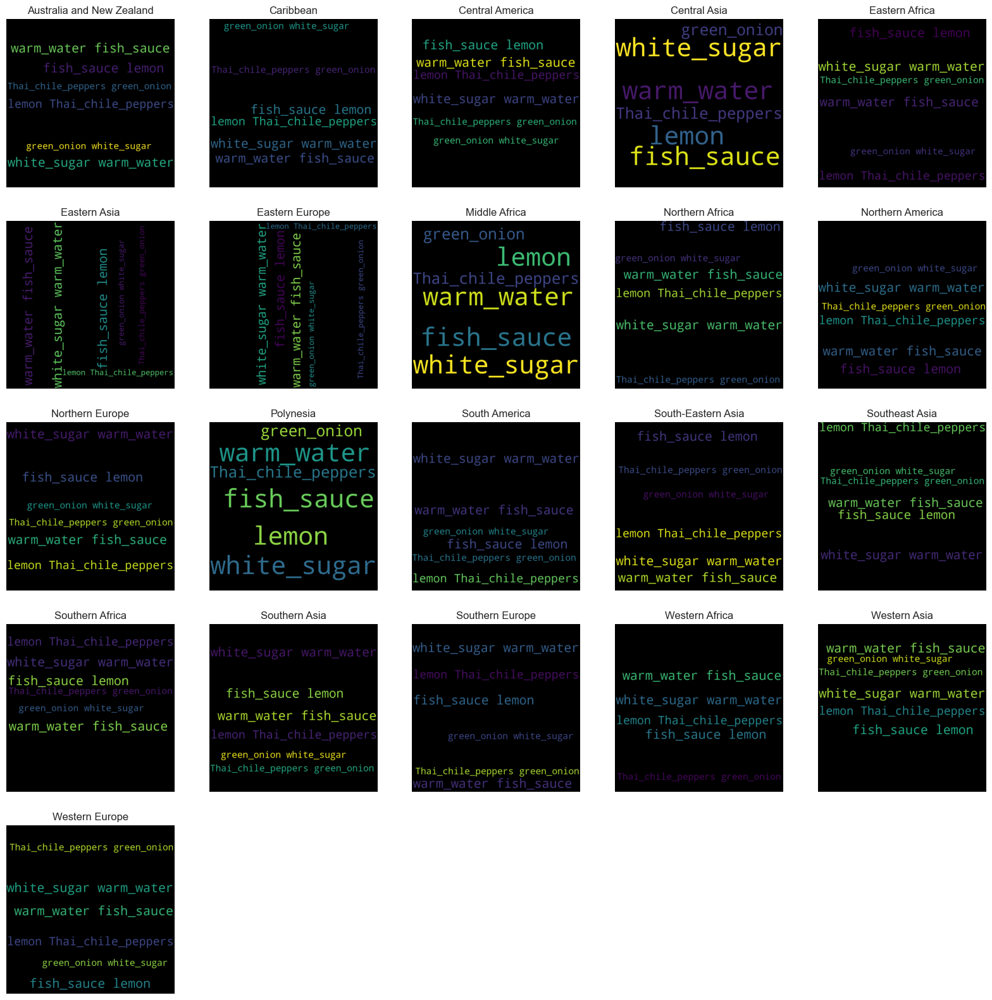

In [62]:
plt.figure(figsize=(20, 20))
for i in range(len(countries)):
    # wc = WordCloud(width=800, height=800, background_color='black').generate(' '.join(c_l[countries[i]]))
    wc = WordCloud(width = 800, height = 800, 
                background_color ='black', 
                stopwords = None, 
                min_font_size = 10).generate(' '.join(c_l[countries[i]]))
    plt.subplot(5, 5, i+1)
    plt.imshow(wc)
    plt.title(countries[i])
    plt.axis('off')
    plt.savefig('../assets/wordcloud.png')

---

In [65]:
data = pd.read_json('../data/json_data/country_ingredients.json', orient='index')
data['country'] = data.index
data = data.reset_index(drop=True)
data.head()

,hickory_wood_chunks,red_new_potatoes,linguiça_sausage,beef_top_sirloin,cooking_grits,blueberries,free_plain_style_yogurt,backfat,Corona_beans,chicken,...,optional_sugar,chicken_bones,Salt,char_siu,crusty_Italian_bread,Polish_sausage_links,shell_prawns,loaf,slices_onion,country
0,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Australia and New Zealand
1,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,1,0,Caribbean
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,2,0,Central America
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Central Asia
4,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,Eastern Africa


In [66]:
X = data.drop(['country'], axis=1)
y = data['country']

X = np.array(X)
y = np.array(y)

In [67]:
# A réaliser :

# 1) calcul des vecteurs propres
lam_train, V_train = np.linalg.eig(X.T @ X)
# lam_test, V_test = np.linalg.eig(XTu.T @ XTu)

# Trouver les indices des deux plus grandes valeurs propres
largest_indices = np.argsort(lam_train)[::-1][:2]



# Extraire les deux plus grandes valeurs propres et leurs vecteurs propres correspondants
largest_eigenvalues = lam_train[largest_indices]


max_train = V_train[:, largest_indices]
# max_test = V_test[:, np.argmax(lam_test)]


# 2) affichage (print)
#print("1er valeur rendue:\n", lam_train)
#print("2e valeur rendue :\n", V_train)

# 3) tri et sélection des 2 vecteurs associés aux 2 plus grandes valeurs propres 
#print("Vecteur train :\n", max_train)

In [68]:
projected_data_train = np.dot(X[y=="Afghanistan"], max_train)

In [69]:
projected_data_train

array([], shape=(0, 2), dtype=complex128)

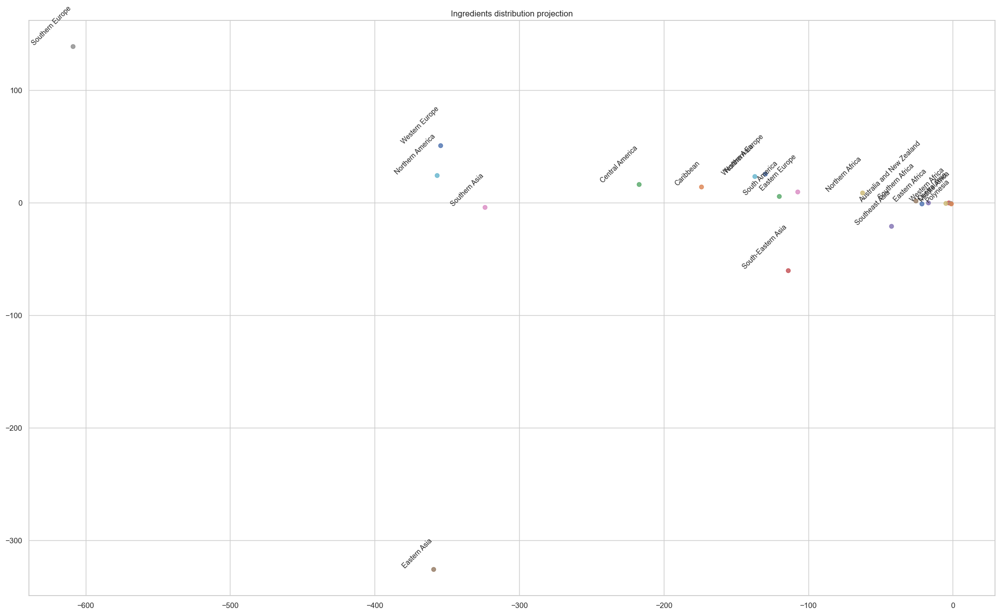

In [84]:
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize=(25,15))
for i in np.unique(y):
    one_train = X[y == i]
    #print(one_train)

    projected_data_train = np.dot(one_train, max_train)

    # Scatter plot for the first point in the class
    plt.scatter(projected_data_train[0, 0], projected_data_train[0, 1], alpha=.8, label=i)
    
    # Add text for each point
    for j in range(projected_data_train.shape[0]):  # Loop through all points in one_train
        plt.text(projected_data_train[j, 0], projected_data_train[j, 1], str(i), fontsize=10, ha='right', va='bottom',rotation=45)

# ####################################
# plt.legend()
plt.title("Ingredients distribution projection")
plt.savefig("../assets/proj_usps_all.png",bbox_inches='tight',pad_inches=0)
plt.show()
